<a href="https://colab.research.google.com/github/chaiminwoo0223/Deep-Learning/blob/main/28%20-%20GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GAN

- Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks(https://arxiv.org/pdf/1511.06434.pdf)
- Multi-GPU 사용법
- Sequential에 OrderedDict를 전달하는 예시

![대체 텍스트](http://www.codingwoman.com/wp-content/uploads/2018/09/gan-2-700x529.jpg)

# Import

In [1]:
import os
import torch
import torch.nn as nn
import torch.utils as utils
import torch.optim as optim
import torch.nn.init as init
import torchvision.utils as v_utils
import torchvision.datasets as dset
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from collections import OrderedDict

## ConvTranspose

In [2]:
test = torch.ones(1, 1, 16, 16)
conv1 = nn.ConvTranspose2d(1, 1, kernel_size=4, stride=2, padding=1)
out = conv1(test)
print(out.size())

conv2 = nn.ConvTranspose2d(1, 1, kernel_size=3, stride=2, padding=1, output_padding=1)
out = conv2(test)
print(out.size())

torch.Size([1, 1, 32, 32])
torch.Size([1, 1, 32, 32])


# Hyperparameter

In [3]:
epoch = 50
batch_size = 512
learning_rate = 0.0002
num_gpus = 1
z_size = 50
middle_size = 200

# Data

In [4]:
mnist_train = dset.MNIST("./", train=True, transform=transforms.ToTensor(), target_transform=None, download=True)
train_loader = DataLoader(dataset=mnist_train, batch_size=batch_size, shuffle=True, drop_last=True)

# Model
## 1.Generator

In [5]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.layer1 = nn.Sequential(OrderedDict([
            ('fc1', nn.Linear(z_size, middle_size)),
            ('bn1', nn.BatchNorm1d(middle_size)),
            ('act1', nn.ReLU())
        ]))
        self.layer2 = nn.Sequential(OrderedDict([
            ('fc2', nn.Linear(middle_size, 784)),
            ('act1', nn.Tanh())
        ]))

    def forward(self, z):
        out = self.layer1(z)
        out = self.layer2(out)
        out = out.view(batch_size, 1, 28, 28)
        return out

## 2.Discriminator

In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.layer1 = nn.Sequential(OrderedDict([
            ('fc1', nn.Linear(784, middle_size)),
            ('act1', nn.LeakyReLU())
        ]))
        self.layer2 = nn.Sequential(OrderedDict([
            ('fc2', nn.Linear(middle_size, 1)),
            ('bn2', nn.BatchNorm1d(1)),
            ('act2', nn.Sigmoid())
        ]))

    def forward(self, x):
        out = x.view(batch_size, -1)
        out = self.layer1(out)
        out = self.layer2(out)
        return out

## 3.Model On GPU

In [7]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(device)

cuda


In [8]:
generator = nn.DataParallel(Generator()).to(device)
discriminator = nn.DataParallel(Discriminator()).to(device)
gen_params = generator.state_dict().keys()
dis_params = discriminator.state_dict().keys()

for i in gen_params:
    print("gen_params:", i)
print("\n")
for j in dis_params:
    print("dis_params:", j)

gen_params: module.layer1.fc1.weight
gen_params: module.layer1.fc1.bias
gen_params: module.layer1.bn1.weight
gen_params: module.layer1.bn1.bias
gen_params: module.layer1.bn1.running_mean
gen_params: module.layer1.bn1.running_var
gen_params: module.layer1.bn1.num_batches_tracked
gen_params: module.layer2.fc2.weight
gen_params: module.layer2.fc2.bias


dis_params: module.layer1.fc1.weight
dis_params: module.layer1.fc1.bias
dis_params: module.layer2.fc2.weight
dis_params: module.layer2.fc2.bias
dis_params: module.layer2.bn2.weight
dis_params: module.layer2.bn2.bias
dis_params: module.layer2.bn2.running_mean
dis_params: module.layer2.bn2.running_var
dis_params: module.layer2.bn2.num_batches_tracked


## 4.Loss_Func & Optimizer

In [9]:
loss_func = nn.MSELoss()
gen_optim = optim.Adam(generator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
dis_optim = optim.Adam(discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.999))
ones_label = torch.ones(batch_size, 1).to(device)
zeros_label = torch.zeros(batch_size, 1).to(device)

# Restore

In [10]:
try:
  os.mkdir("./model")
except:
  pass

try:
  os.mkdir("./result")
except:
  pass

# Train

In [11]:
for i in range(epoch):
    for j, (image, label) in enumerate(train_loader):
        image = image.to(device)
        # 구분자 학습
        dis_optim.zero_grad()
        z = init.normal_(torch.Tensor(batch_size, z_size), mean=0, std=0.1).to(device)
        gen_fake = generator.forward(z)
        dis_fake = discriminator.forward(gen_fake) # Fake Data
        dis_real = discriminator.forward(image)    # Real Data
        dis_loss = torch.sum(loss_func(dis_fake, zeros_label)) + torch.sum(loss_func(dis_real, ones_label))
        dis_loss.backward(retain_graph=True)
        dis_optim.step()
        # 생성자 학습
        gen_optim.zero_grad()
        z = init.normal_(torch.Tensor(batch_size, z_size), mean=0, std=0.1).to(device)
        gen_fake = generator.forward(z)
        dis_fake = discriminator.forward(gen_fake) # Fake Data
        gen_loss = torch.sum(loss_func(dis_fake, ones_label))
        gen_loss.backward(retain_graph=True)
        gen_optim.step()
        # Model Save
        if j % 100 == 0:
            print(gen_loss,dis_loss)
            print("{}th epoch gen_loss: {} dis_loss: {}".format(i,gen_loss.data,dis_loss.data))
            torch.save([generator,discriminator],'./model/vanilla_gan.pkl')
            v_utils.save_image(gen_fake.cpu().data[0:25],"./result/gen_{}_{}.png".format(i,j), nrow=5)

tensor(0.2938, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.5849, device='cuda:0', grad_fn=<AddBackward0>)
0th epoch gen_loss: 0.2938126027584076 dis_loss: 0.5848751068115234
tensor(0.2944, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.5181, device='cuda:0', grad_fn=<AddBackward0>)
0th epoch gen_loss: 0.294379323720932 dis_loss: 0.5181019306182861
tensor(0.2927, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.5103, device='cuda:0', grad_fn=<AddBackward0>)
1th epoch gen_loss: 0.2926543653011322 dis_loss: 0.5103147029876709
tensor(0.2936, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.4995, device='cuda:0', grad_fn=<AddBackward0>)
1th epoch gen_loss: 0.2936052083969116 dis_loss: 0.49949637055397034
tensor(0.2929, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.4927, device='cuda:0', grad_fn=<AddBackward0>)
2th epoch gen_loss: 0.29291218519210815 dis_loss: 0.49272027611732483
tensor(0.2949, device='cuda:0', grad_fn=<SumBackward0>) tensor(0.5019, device='cuda:0', grad_fn=<A

0


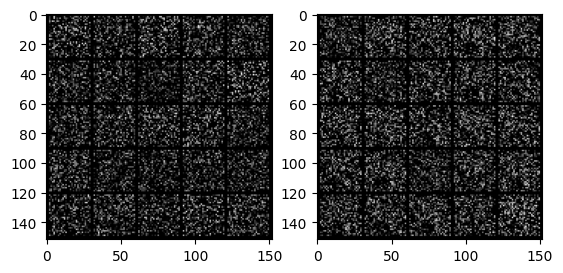

1


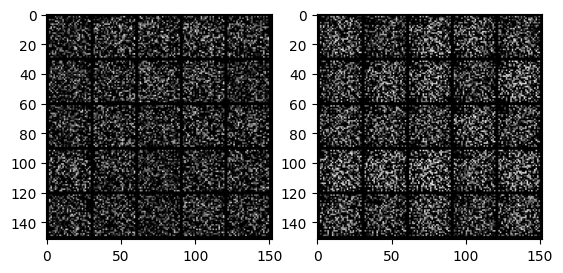

2


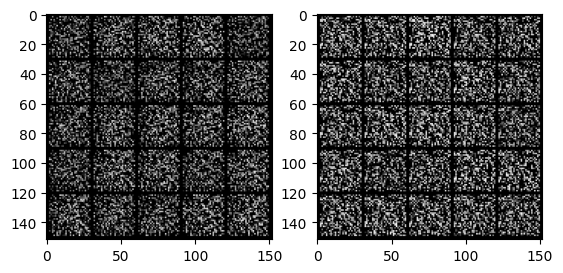

3


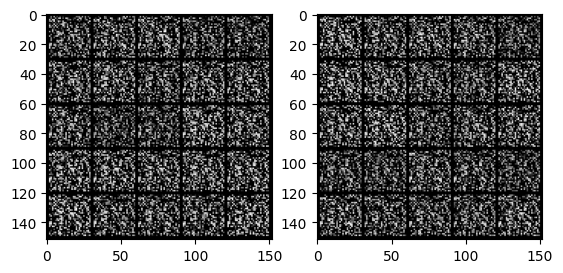

4


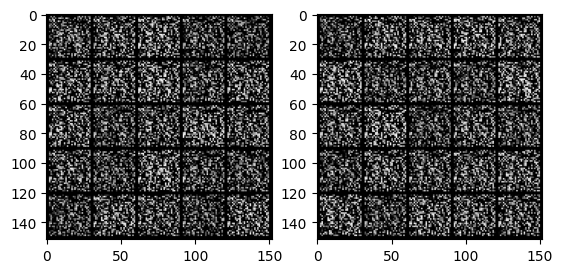

5


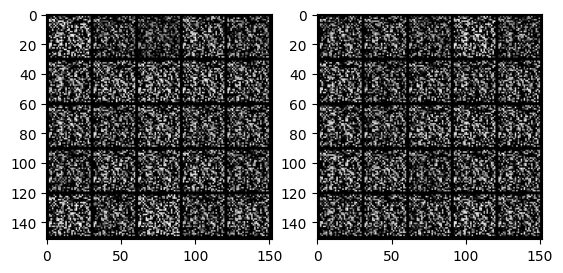

6


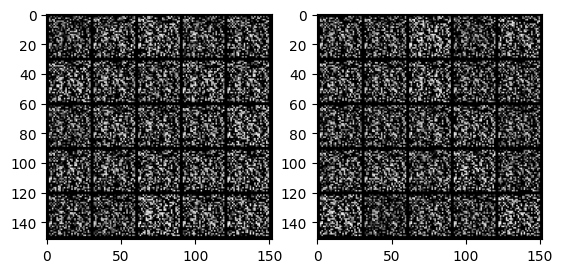

7


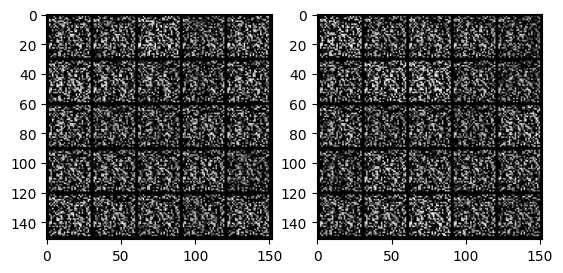

8


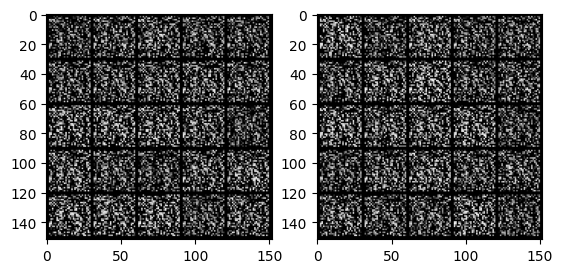

9


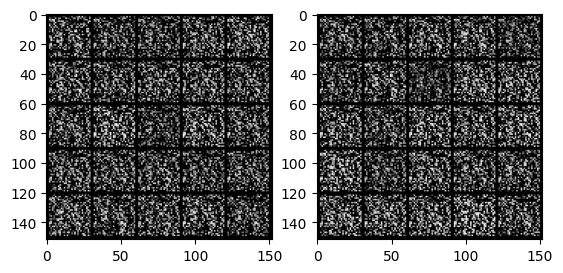

10


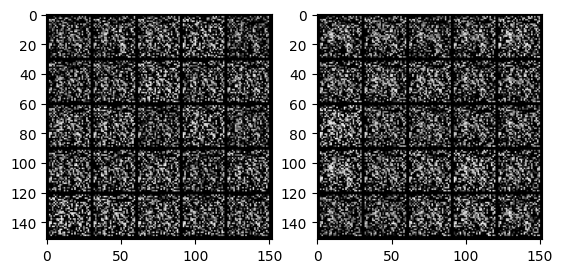

11


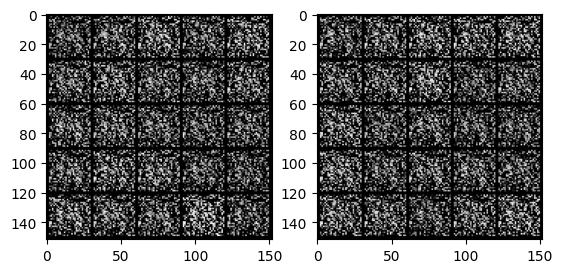

12


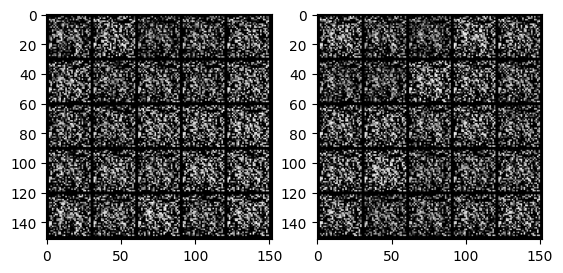

13


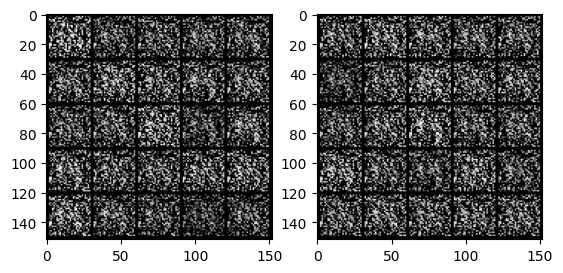

14


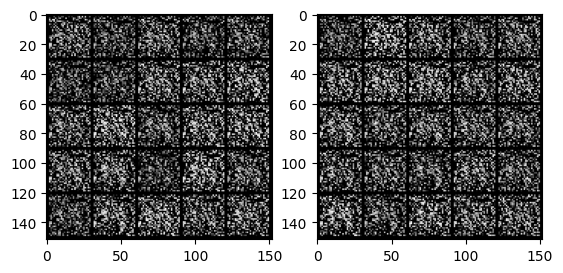

15


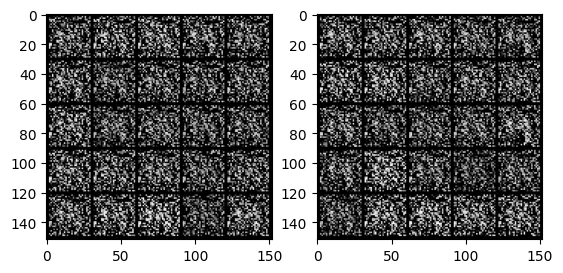

16


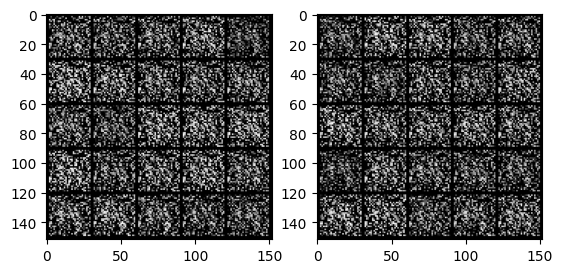

17


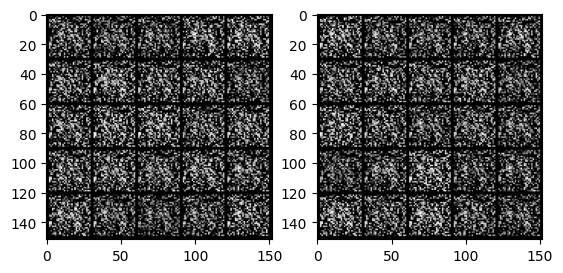

18


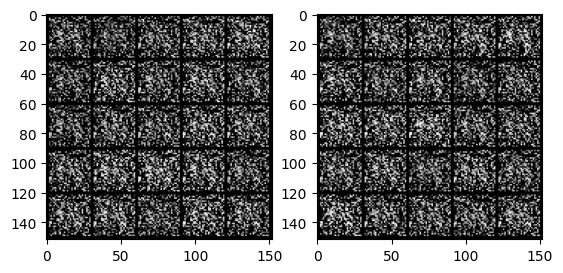

19


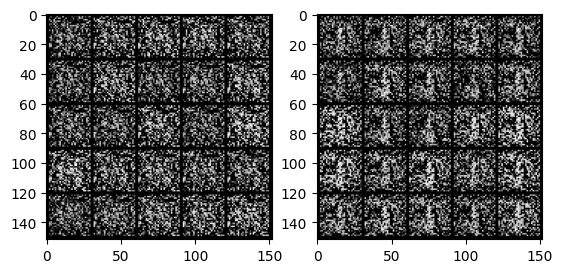

20


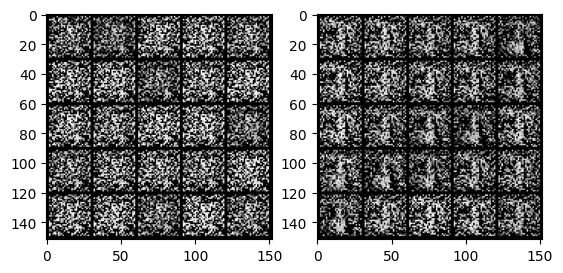

21


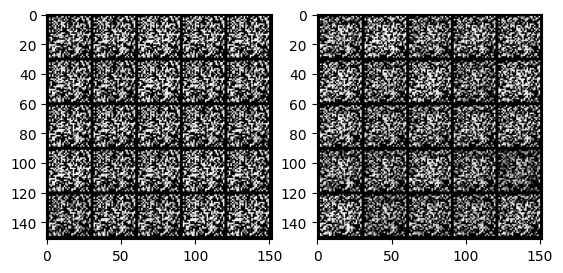

22


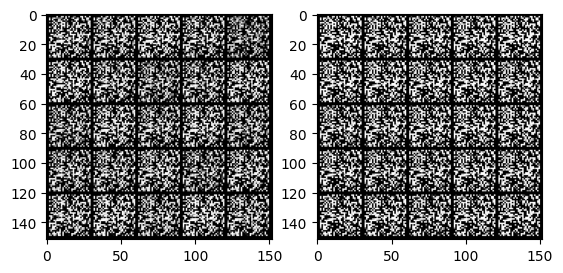

23


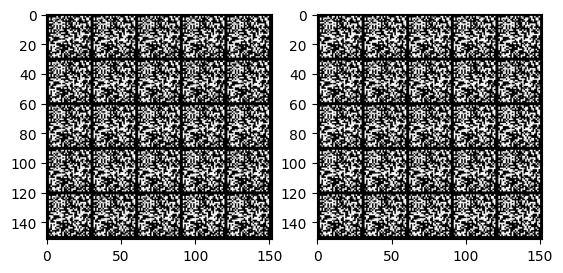

24


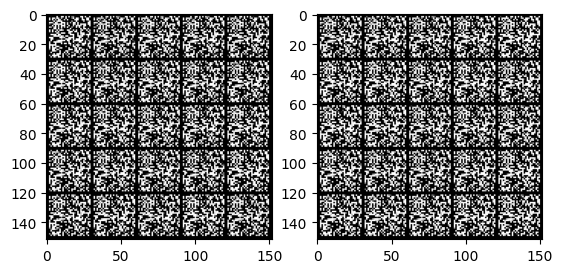

25


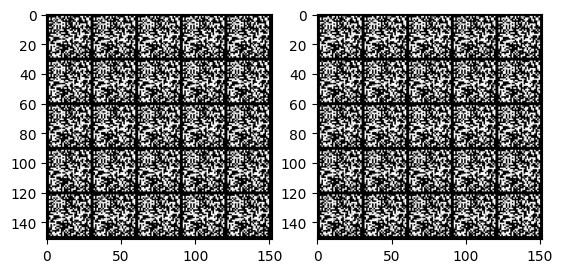

26


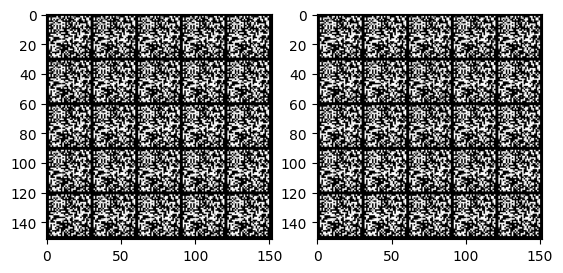

27


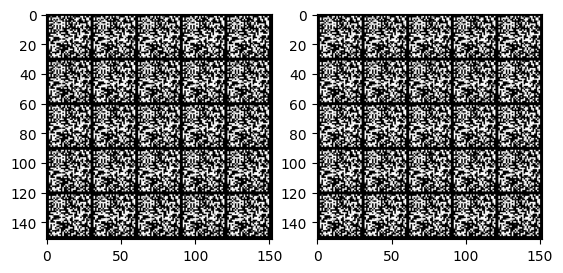

28


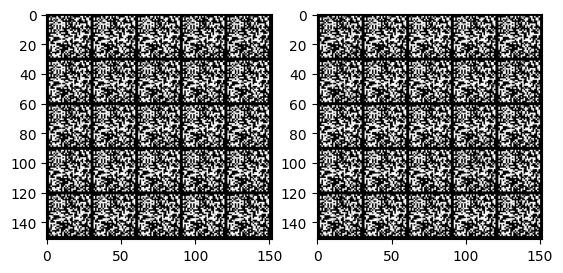

29


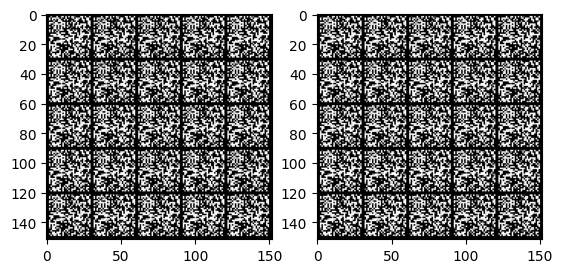

30


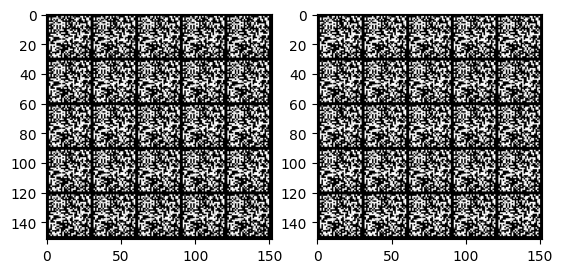

31


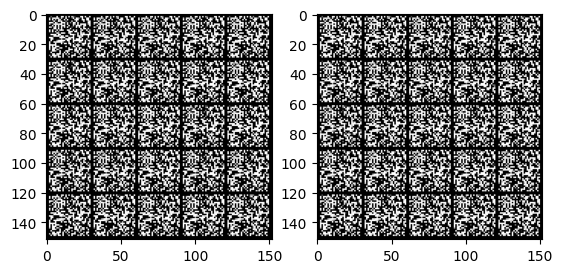

32


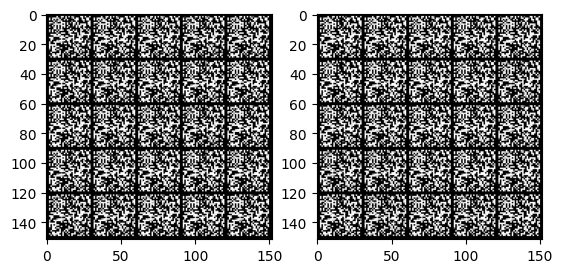

33


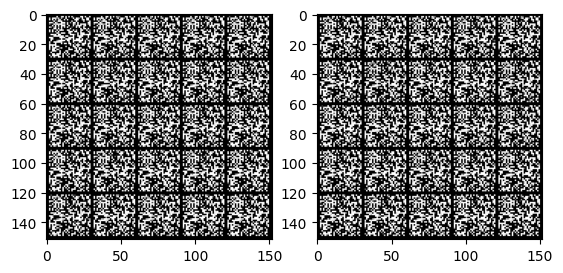

34


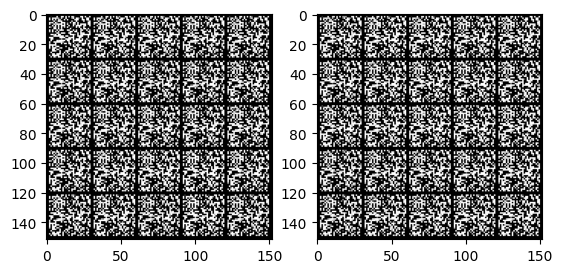

35


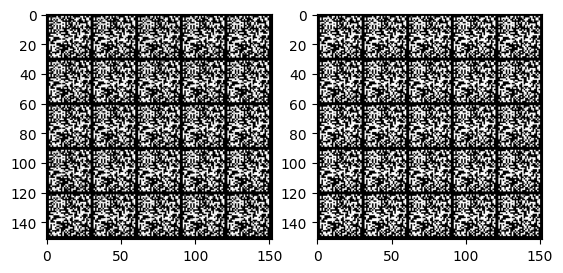

36


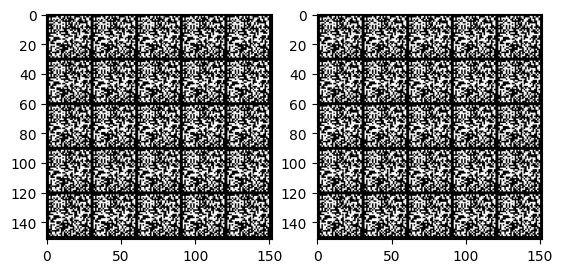

37


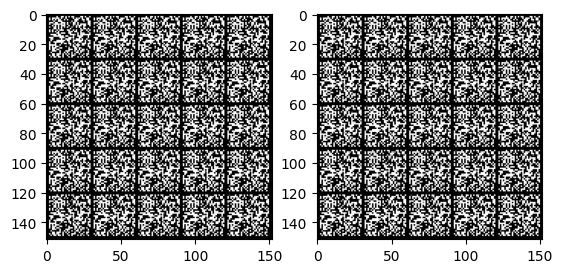

38


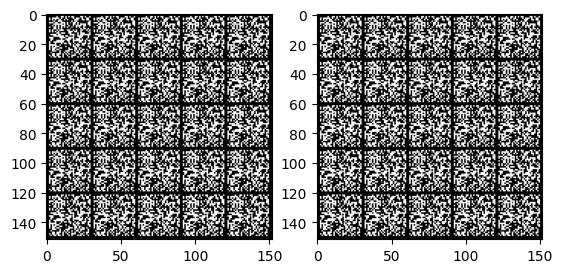

39


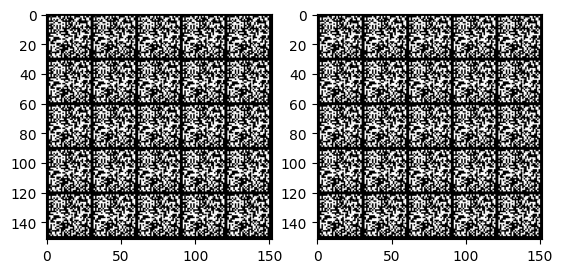

40


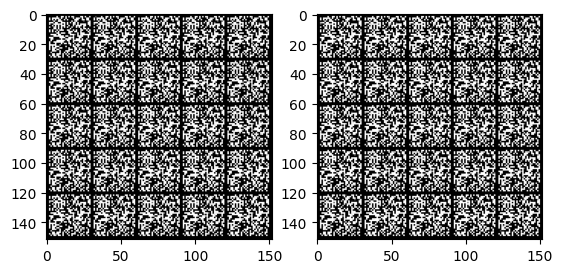

41


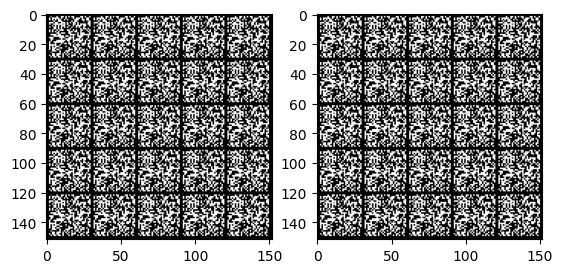

42


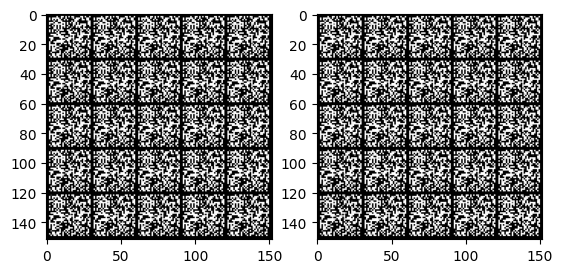

43


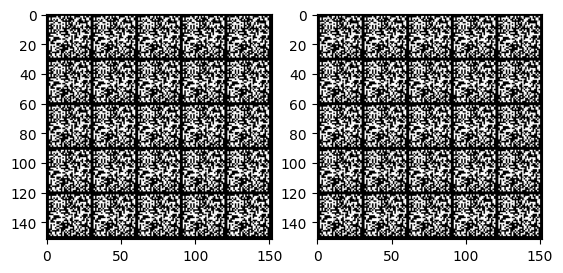

44


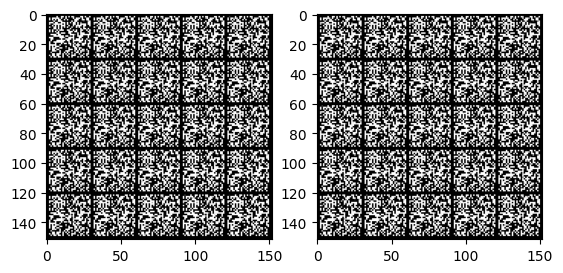

45


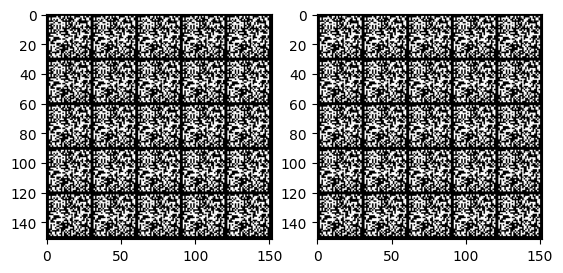

46


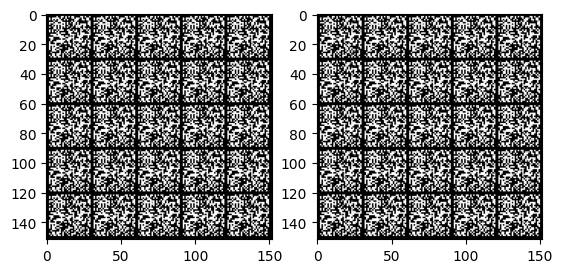

47


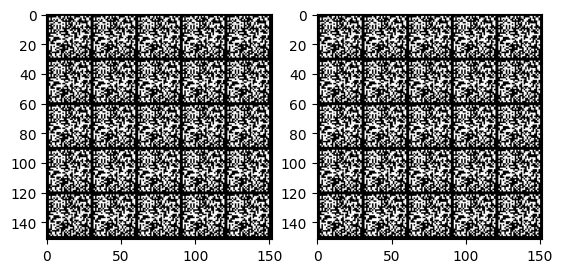

48


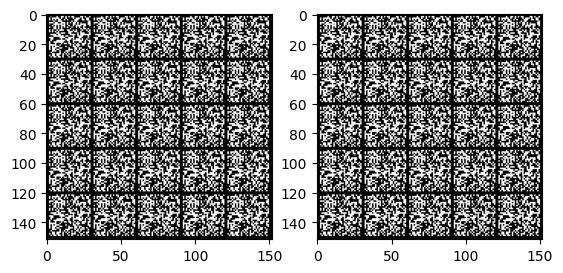

49


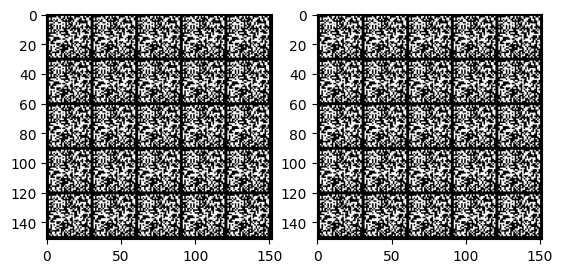

In [12]:
from glob import glob

for i in range(epoch):
  print(i)
  file_list = glob("./result/gen_{}_*.png".format(i))
  img_per_epoch = len(file_list)
  for idx, j in enumerate(file_list):
    img = plt.imread(j)
    plt.subplot(1,img_per_epoch,idx+1)
    plt.imshow(img)
  plt.show()